In [7]:
import geopandas as gpd
import pandas as pd
import numpy as np
import altair as alt
from shapely.geometry.base import BaseMultipartGeometry
from shapely.geometry.polygon import orient as orient_
from shapely.geometry import Polygon

def orient(geom, sign=1.0):
    if isinstance(geom, BaseMultipartGeometry):
        return geom.__class__(
            list(
                map(
                    lambda geom: orient(geom, sign),
                    geom.geoms,
                )
            )
        )
    if isinstance(geom, (Polygon,)):
        return orient_(geom, sign)
    return geom
%matplotlib inline

In [63]:
def combine_fews_csv_export_and_shp_layer(fp_shp, fp_csv, cum_per='1d', moment='T0'):

    
    RD_PROJ = ("+proj=sterea +lat_0=52.15616055555555 +lon_0=5.38763888888889 "
                 "+k=0.999908 +x_0=155000 +y_0=463000 +ellps=bessel +units=m "
                 "+towgs84=565.2369,50.0087,465.658,-0.406857330322398,0.350732676542563,-1.8703473836068,4.0812 "
                 "+no_defs +no_defs")

    gdf = gpd.read_file(fp_shp)
    gdf.crs = RD_PROJ
    gdf = gdf.to_crs({'init': 'epsg:4326'})
    gdf.S = gdf.S.str.zfill(10)

    df = pd.read_csv(fp_csv, sep=';')

    # format Datum column to datetime and set as index
    df.Datum = pd.to_datetime(df.Datum, format='%Y-%m-%d %H')
    df.set_index('Datum', inplace=True)

    # set NaN values
    df.replace(-999.0, np.NaN, inplace=True)

    # zfill locations to fixed 10 characters
    df.Location = df.Location.astype(str).str.zfill(10)

    # resample to cumulative day sum
    df = df.groupby('Location').resample(cum_per).sum().reset_index()

    # get unique last timestamp or resampled dataframe
    if moment == 'T0':
        last_ts = df.Datum.unique()[-1] 
    elif moment == 'T-1':
        last_ts = df.Datum.unique()[-2] 
    elif moment == 'T-2':
        last_ts = df.Datum.unique()[-2] 

    # filter by last date and reset index
    df = df[df['Datum'] == last_ts].reset_index(drop=True)    
    
    # apply inner-join of cumulative precip data with geolocations
    gdf = pd.merge(gdf, df, left_on='S', right_on='Location')
    gdf.geometry = gdf.geometry.apply(orient, args=(-1,))
    gdf.loc[:,'X'] = gdf.geometry.centroid.x
    gdf.loc[:,'Y'] = gdf.geometry.centroid.y
    
    return gdf

In [64]:
fp_shp = r"D:\Projects\Pr\3786.30\Toeleveringen\sub_stroomgebieden_NL_D.shp"
#fp_shp = r"D:\Projects\Pr\3786.30\Werkfolder\sub_stroomgebieden_NL_D\sub_stroomgebieden_NL_D.shp"
fp_csv = r"D:\Projects\Pr\3786.30\Toeleveringen\NeerslagkaartData.csv"
fp_geojson = r"D:\Projects\Pr\3786.30\Werkfolder\NeerslagkaartData.geo.json"

In [65]:
gdf = combine_fews_csv_export_and_shp_layer(fp_shp, fp_csv)

In [66]:
gdf.head()

,S,MEAN_GFEAF,SUM_Shape_,FIRST_naam,geometry,Location,Datum,Neerslag (mm/h),X,Y
0,0000000011,0.520839,247728.834533,De Lander 1_011,"POLYGON ((6.39701778570163 51.83451822448384, ...",0000000011,2018-10-24,0.0,6.400571,51.831397
1,0000000012,0.495841,328579.263609,De Lander 1_012,"POLYGON ((6.391456449798089 51.83820011818917,...",0000000012,2018-10-24,0.0,6.389298,51.836299
2,0000000013,0.845868,101799.308007,De Lander 1_013,"POLYGON ((6.381115574473139 51.83824252172525,...",0000000013,2018-10-24,0.0,6.378250,51.837235
3,0000000041,0.500000,892337.509999,Geitenwaard_041,"POLYGON ((6.095191709901481 51.88267612791485,...",0000000041,2018-10-24,0.0,6.076596,51.881341
4,0000000042,0.500000,577288.279561,Geitenwaard_042,"POLYGON ((6.045760987707258 51.88685523805984,...",0000000042,2018-10-24,0.0,6.039257,51.882791


In [9]:
# to file
gdf.to_file(fp_geojson, driver='GeoJSON')

In [94]:
pts = alt.Chart(gdf).mark_circle(stroke='lightgray').encode(
    longitude = alt.Longitude(
        field = 'X', 
        type = 'quantitative'
    ),
    latitude = alt.Latitude(
        field = 'Y', 
        type = 'quantitative'
    ),    
    fill = alt.Fill(
        field = 'Neerslag (mm/h)', 
        type = 'quantitative',     
        scale = alt.Scale(
            type = 'threshold', 
            domain = [0.1, 0.5, 1, 3, 5, 10],
            range = ["#FFFFFF", "#D4D4EE", "#B5B6E4", "#797BC5", "#402A8C", "#A36D55", "#F38321"]
        )
    ),
    size = alt.Size(
        field = 'Neerslag (mm/h)', 
        type = 'quantitative',
        scale = alt.Scale(
            type = 'threshold', 
            domain = [0.1, 0.5, 1, 3, 5, 10],
            range = [25,25,25,25,25,25]
        ),
        legend = alt.Legend(symbolSize=1000)
    )      
)

In [95]:
pts.to_dict()

TypeError: sequence item 1: expected str instance, int found

In [75]:
# to interactive html
feats = alt.Chart(gdf).mark_geoshape(stroke='lightgray').encode(
    fill = alt.Fill(
        field = 'Neerslag (mm/h)', 
        type = 'quantitative',
        legend = None,
        scale = alt.Scale(
            type = 'threshold', 
            domain = [0.1, 0.5, 1, 3, 5, 10],
            range = ["#FFFFFF", "#D4D4EE", "#B5B6E4", "#797BC5", "#402A8C", "#A36D55", "#F38321"]
        ),
    ), 
    tooltip = ['FIRST_naam', 'Neerslag (mm/h)']
)

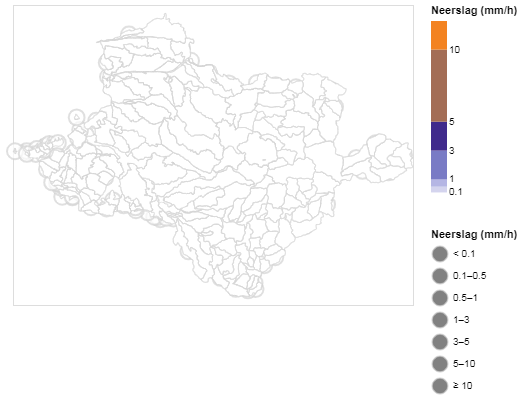

In [78]:
pts + feats

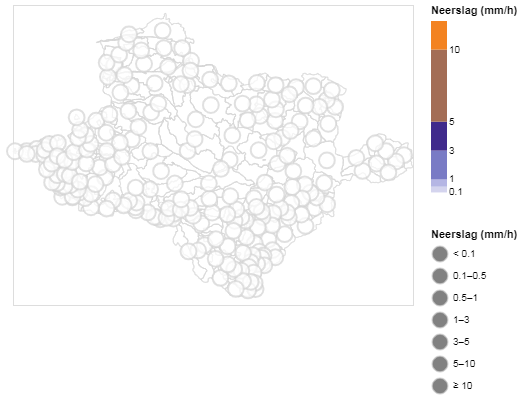

In [76]:
feats + pts

In [11]:
import hkvportal
database = 'hoek'
uid = '236ebLIeCDdnKbfGe956IvZetIv1'
url = 'https://tsws.hkvservices.nl/mangrove.ws/'
dp = hkvportal.Service(url, uid)

Dataservice is recognized. https://tsws.hkvservices.nl/mangrove.ws/entry.asmx?WSDL will be used as portal


In [12]:
# store temporarily in the portal
dp.new_entry(
    database='hoek',
    key='wrij_cum24_mm_hr',
    data=chart.to_html(),
    description='WRIJ cumulatief neerslag 24 uur mm/hr'
)

entry available at:
https://tsws.hkvservices.nl/mangrove.ws/data.ashx?function=dataportal.db.getdata&parameters={database:'hoek',key:'wrij_cum24_mm_hr'}&contentType=SET_BY_USER
